# Volcano plot
- mode: HILICpos

In [1]:
# Let the middle rows included.
options(repr.matrix.max.rows=600, repr.matrix.max.cols=200)
# options(warn=-1)

In [2]:
# Load packages
library(dplyr)
library(ggplot2)

# Install ggrepel package if needed
# install.packages("devtools")
# devtools::install_github("slowkow/ggrepel")
library(ggrepel) #To be able to make ggplot without overlapping labeling
library(glue)


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




In [3]:
# Read data from the web
res_file_name = "../../output/hMinImp_TICnorm_groupFil0.3_HILICpos_1wayANOVA/one_wayANOVA_hMinImp_TICnorm_groupFil0.3_HILICpos_fullreport.csv"
annot_file_name = "../../input/HILICpos_mzML/output_asari_project_223172519/Feature_annotation.tsv"
res_df = read.table(res_file_name, row.names = 1,header=TRUE, sep = ',')

In [4]:
head(res_df)

,mz,rtime,rtime_left_base,rtime_right_base,parent_masstrack_id,peak_area,cSelectivity,goodness_fitting,snr,detection_counts,Naive_percNA,Naive_mean,R5neg_percNA,R5neg_mean,R5pos_percNA,R5pos_mean,gMean_Naive,gMean_R5neg,gMean_R5pos,log2FC_R5negvsNaive,log2FC_R5posvsNaive,log2FC_R5posvsR5neg,f_score,pval,padj,Tpadj_R5neg.Naive,Tpadj_R5pos.Naive,Tpadj_R5pos.R5neg,TFDR_R5neg.Naive,TFDR_R5pos.Naive,TFDR_R5pos.R5neg,Naive_1,Naive_2,Naive_3,R5neg_1,R5neg_2,R5neg_3,R5pos_1,R5pos_2,R5pos_3,nist,q3June2014_1,q3June2014_2
,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
F10005,362.1607,59.85,56.96,63.00,9716,7971863,1.0,0.89,553,6,0.0000000,712074.3,1.0000000,NA,0.0000000,860490.3,19.32215,17.68319,19.34045,-1.6389550,0.01830805,1.65726304,17.4216760,0.003170222,0.02086623,0.005417521,0.9982244,0.005127861,0.0474435,1,0.02923725,19.66657,19.01277,19.28709,17.68319,17.68319,17.68319,18.68319,19.47935,19.85883,NA,NA,NA
F10015,296.9425,53.54,50.65,55.65,8137,45604739,0.8,0.90,3729,19,0.0000000,639860.0,0.6666667,247029,0.0000000,1915439.3,19.02161,17.54998,20.49799,-1.4716270,1.47638417,2.94801120,13.8958783,0.005597852,0.02827235,0.086349193,0.0854230,0.004521396,0.2623614,1,0.02749508,20.08540,18.76799,18.21144,18.22707,17.21144,17.21144,20.59919,20.80727,20.08752,21.41660,21.52271,21.49107
F10051,297.0818,24.64,21.49,26.74,8141,18781489,1.0,0.99,229,21,0.0000000,1359339.7,0.0000000,1113708,0.0000000,1231958.7,20.28177,20.39196,19.89904,0.1101873,-0.38273096,-0.49291825,4.7506986,0.057988412,0.12919182,0.795826539,0.1351597,0.058863696,0.9448309,1,0.13965009,20.41379,20.36101,20.07052,20.31642,20.19594,20.66352,19.74872,20.10360,19.84481,21.62776,21.86602,21.45040
F10055,362.9256,53.54,50.65,55.65,9727,1190152067,0.8,0.89,10246,24,0.0000000,49415361.7,0.0000000,11720798,0.0000000,139323217.3,25.36708,23.33422,26.68040,-2.0328592,1.31332274,3.34618193,10.0132631,0.012251948,0.04625361,0.079393292,0.2657568,0.010378615,0.2497149,1,0.04465705,26.20289,25.02777,24.87057,24.88123,22.87881,22.24261,26.83909,26.93214,26.26998,27.58698,27.72694,27.62164
F10064,297.1326,26.22,23.85,29.37,8143,4680991,1.0,1.00,510,6,0.6666667,493549.0,0.3333333,1148254,0.0000000,1629294.0,18.26046,19.57221,20.05474,1.3117445,1.79427166,0.48252718,2.0185185,0.213617668,0.31116677,0.390021540,0.2077485,0.863705268,0.6334596,1,0.95465788,18.92713,17.92713,17.92713,19.89468,17.92713,20.89481,19.21692,21.31301,19.63428,NA,NA,NA
F10083,297.2417,25.17,22.80,27.01,8147,61885891,1.0,1.00,371,18,0.0000000,912381.0,0.6666667,1391054,0.6666667,2680708.0,19.58229,18.98048,18.99901,-0.6018108,-0.58327978,0.01853103,0.1900062,0.831743035,0.86515013,0.854168634,0.8621659,0.999846446,0.9878553,1,1.00000000,19.17536,20.48820,19.08333,18.08333,18.08333,20.77480,20.83039,18.08333,18.08333,23.20271,23.25330,23.62045


-------

-------

-------

## Create output directory

In [5]:
out_dir = "../../output/hMinImp_TICnorm_groupFil0.3_HILICpos_1wayANOVA/volcano_plot/"
dir.create(out_dir)

In [6]:
head(res_df,2)

,mz,rtime,rtime_left_base,rtime_right_base,parent_masstrack_id,peak_area,cSelectivity,goodness_fitting,snr,detection_counts,Naive_percNA,Naive_mean,R5neg_percNA,R5neg_mean,R5pos_percNA,R5pos_mean,gMean_Naive,gMean_R5neg,gMean_R5pos,log2FC_R5negvsNaive,log2FC_R5posvsNaive,log2FC_R5posvsR5neg,f_score,pval,padj,Tpadj_R5neg.Naive,Tpadj_R5pos.Naive,Tpadj_R5pos.R5neg,TFDR_R5neg.Naive,TFDR_R5pos.Naive,TFDR_R5pos.R5neg,Naive_1,Naive_2,Naive_3,R5neg_1,R5neg_2,R5neg_3,R5pos_1,R5pos_2,R5pos_3,nist,q3June2014_1,q3June2014_2
,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
F10005,362.1607,59.85,56.96,63.00,9716,7971863,1.0,0.89,553,6,0,712074.3,1.0000000,NA,0,860490.3,19.32215,17.68319,19.34045,-1.638955,0.01830805,1.657263,17.42168,0.003170222,0.02086623,0.005417521,0.9982244,0.005127861,0.0474435,1,0.02923725,19.66657,19.01277,19.28709,17.68319,17.68319,17.68319,18.68319,19.47935,19.85883,NA,NA,NA
F10015,296.9425,53.54,50.65,55.65,8137,45604739,0.8,0.90,3729,19,0,639860.0,0.6666667,247029,0,1915439.3,19.02161,17.54998,20.49799,-1.471627,1.47638417,2.948011,13.89588,0.005597852,0.02827235,0.086349193,0.0854230,0.004521396,0.2623614,1,0.02749508,20.08540,18.76799,18.21144,18.22707,17.21144,17.21144,20.59919,20.80727,20.08752,21.4166,21.52271,21.49107


------

------

------

# Volcano plot function

In [7]:
volcano_plot <- function(res_df = res_df,
                            padj_colname = padj_colname,
                            log2FC_colname = log2FC_colname,
                            p_cut_off = p_cut_off,
                            log2FC_cut_off = log2FC_cut_off,
                            xlab = xlab,
                            ylab = 'log10(FDR)',
                            xlim = xlim,
                            ylim = ylim,
                            highlight_text = FALSE,
                            fig_width = 8,
                            fig_height = 8,
                            text_size = 20,
                            legend_size = 20,
                            axis_title_size = 20,
                            output_dir = "",
                            pdf_prefix = 'test',
                            show_plot = TRUE) {
    
    colnames(res_df)
    res_df = mutate(res_df, 
                     Label = ifelse((res_df[,padj_colname] < p_cut_off) & (abs(res_df[,log2FC_colname]) > 1),  # Label is the column that distinguish the coloring
                                  "Significant", 
                                  "Not Sign.")) #mutate is a good function 

    res_df$log10padj = -log(res_df[,padj_colname],10)
    print(paste0("range of log10padj: ", range(res_df$log10padj),'\n', "range of log2FC: ", range(res_df$log2FC)))
    
    options(repr.plot.width = fig_width, repr.plot.height = fig_height)
    
    hist(res_df[,log2FC_colname], breaks =30)
    
    p = ggplot( res_df, 
                aes_string(log2FC_colname,"log10padj")) +
                geom_point(aes(col=Label), alpha = 0.5) +
                scale_color_manual(values=c("#888888","#ff0000")) +
                xlim(xlim) + 
                ylim(ylim) + 
                xlab(xlab) +
                ylab(ylab) +
                
                theme(
                      panel.grid.major = element_line(colour = "grey50",linetype = "dashed", size = 0.2),
                      panel.border = element_rect(fill = NA),
                      #panel.grid.minor = element_blank(),
                      panel.background = element_rect(fill = "transparent",colour = NA),
                      plot.background = element_rect(fill = "transparent",colour = NA),
                      axis.text = element_text(size = text_size, colour="black"),
                      axis.text.x = element_text(colour="black"),
                      legend.text= element_text(size = legend_size),
                      legend.title = element_text(size = legend_size),
                      axis.title = element_text(size = axis_title_size)
                    )
    if(highlight_text == TRUE) {
        print("With highlighted text")
        p = p + geom_text_repel(data = filter(res_df, highlight != ""), 
                                aes(label = highlight),
                                max.overlaps = Inf)
    }
    
    if (show_plot == TRUE) {
        print(p) # display the plot
    } else {return(p)}

    if (length(output_dir)!=0) {
            ggsave(file.path(output_dir, 
                             glue("volcano_plot_",
                                                pdf_prefix,".pdf")), 
                   width = fig_width, 
                   height = fig_height)
        }
}

# Volcano plot
## log2FC R5pos vs R5neg

In [8]:
padj_colname = 'TFDR_R5pos.R5neg'
log2FC_colname = 'log2FC_R5posvsR5neg'
contrast = "R5pos vs. R5neg"

### No highlight

Warning message in min(x, na.rm = na.rm):
“no non-missing arguments to min; returning Inf”
Warning message in max(x, na.rm = na.rm):
“no non-missing arguments to max; returning -Inf”


[1] "range of log10padj: 0\nrange of log2FC: Inf"                
[2] "range of log10padj: 5.79988686527762\nrange of log2FC: -Inf"


Warning message:
“`aes_string()` was deprecated in ggplot2 3.0.0.
ℹ Please use tidy evaluation ideoms with `aes()`”
Warning message:
“The `size` argument of `element_line()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead.”
Warning message:
“Removed 6 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 6 rows containing missing values (`geom_point()`).”


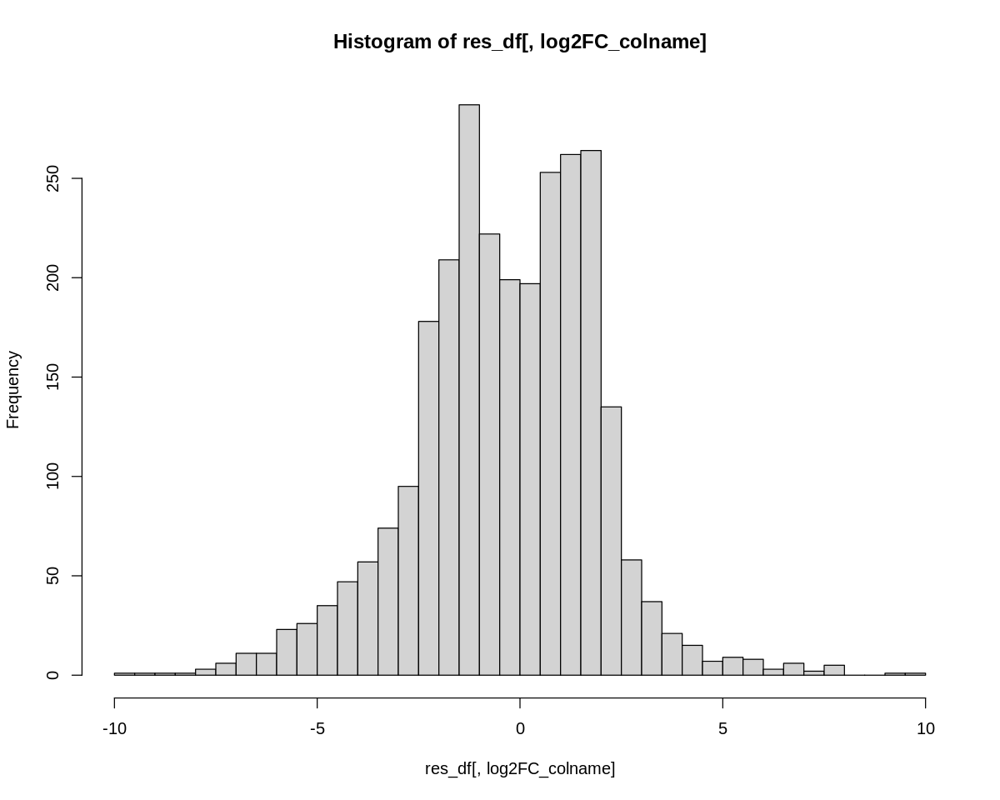

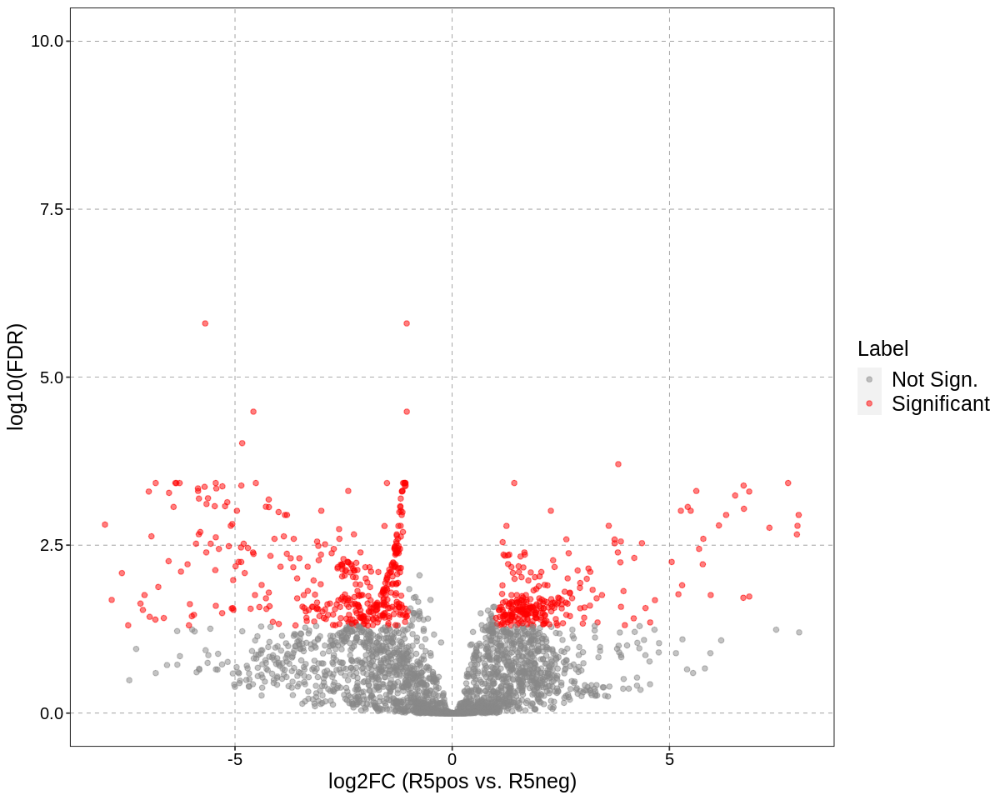

In [9]:
volcano_plot(res_df = res_df,
                padj_colname = padj_colname,
                log2FC_colname = log2FC_colname,
                p_cut_off = 0.05,
                log2FC_cut_off = 1,
                xlab = glue("log2FC ({contrast})"),
                ylab = 'log10(FDR)',
                xlim = c(-8,8),
                ylim = c(0,10),
                highlight = FALSE,
                fig_width = 10,
                fig_height = 8,
                text_size = 12,
                legend_size = 15,
                axis_title_size = 15,
                output_dir = out_dir,
                pdf_prefix = glue('{contrast}'),
                show_plot = TRUE)

## With highlight

### Select parameters for highlight

In [10]:
want2annotate_feature_name = TRUE
topN = 150

In [11]:
select_topN2present <- function(res_df, annot_df, topN, padj_label) {
    res_df = res_df %>% arrange_(padj_colname) 
    featIDs = rownames(res_df[1:topN,])
    annot_list = list()
    res_df['highlight'] = ""
    for (featID in featIDs) {
        res_df[featID,'highlight'] = annot_df[annot_df['X.peak.id_number']==featID,'name_1st_guess'][1]
    }
    
    return(res_df)
}

if(want2annotate_feature_name) {
    annot_df = read.csv(annot_file_name, sep = '\t') #somehow only dplyr read.csv works 
    res_df = select_topN2present(res_df, annot_df, topN)
}

Warning message:
“`arrange_()` was deprecated in dplyr 0.7.0.
ℹ Please use `arrange()` instead.
ℹ See vignette('programming') for more help”


In [12]:
unique(res_df$highlight)

[1] ""                                                                                                                                                                                                                                        
 [2] "Glycodiazine"                                                                                                                                                                                                                            
 [3] "PS(18:0/22:6(4Z,7Z,10Z,13Z,16Z,19Z))"                                                                                                                                                                                                    
 [4] "PE(P-18:0/20:4(5Z,8Z,11Z,14Z))"                                                                                                                                                                                                          
 [5] "Taurine"                                                                                                                                                                                                                                 
 [6] "Glutathionate(1-)"                                                                                                                                                                                                                       
 [7] "alpha-CEHC glucuronide"                                                                                                                                                                                                                  
 [8] "PS(20:3(8Z,11Z,14Z)/22:6(4Z,7Z,10Z,13Z,16Z,19Z))"                                                                                                                                                                                        
 [9] "6-{[7,8,9,12,13,14,18,19,25,29-decahydroxy-24-(hydroxymethyl)-4,22,27-trioxo-3,23,26-trioxahexacyclo[13.10.3.1²,⁶.0⁵,¹⁰.0¹¹,²⁸.0¹⁶,²¹]nonacosa-5(10),6,8,11,13,15(28),16,18,20-nonaen-17-yl]oxy}-3,4,5-trihydroxyoxane-2-carboxylic acid"
[10] "Pyranodelphinin B"                                                                                                                                                                                                                       
[11] "PC(18:1(11Z)/P-18:1(11Z))"

Warning message in min(x, na.rm = na.rm):
“no non-missing arguments to min; returning Inf”
Warning message in max(x, na.rm = na.rm):
“no non-missing arguments to max; returning -Inf”


[1] "range of log10padj: 0\nrange of log2FC: Inf"                
[2] "range of log10padj: 5.79988686527762\nrange of log2FC: -Inf"
[1] "With highlighted text"


Warning message:
“Removed 6 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 1 rows containing missing values (`geom_text_repel()`).”
Warning message:
“Removed 6 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 1 rows containing missing values (`geom_text_repel()`).”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on '6-{[7,8,9,12,13,14,18,19,25,29-decahydroxy-24-(hydroxymethyl)-4,22,27-trioxo-3,23,26-trioxahexacyclo[13.10.3.1²,⁶.0⁵,¹⁰.0¹¹,²⁸.0¹⁶,²¹]nonacosa-5(10),6,8,11,13,15(28),16,18,20-nonaen-17-yl]oxy}-3,4,5-trihydroxyoxane-2-carboxylic acid' in 'mbcsToSbcs': dot substituted for <e2>”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on '6-{[7,8,9,12,13,14,18,19,25,29-decahydroxy-24-(hydroxymethyl)-4,22,27-trioxo-3,23,26-trioxahexacyclo[13.10.3.1²,⁶.0⁵,¹⁰.0¹¹,²⁸.0¹⁶,²¹]nonacosa-5(10),6,8,11,13,15(28),16,18,20-nonaen-17-yl]o

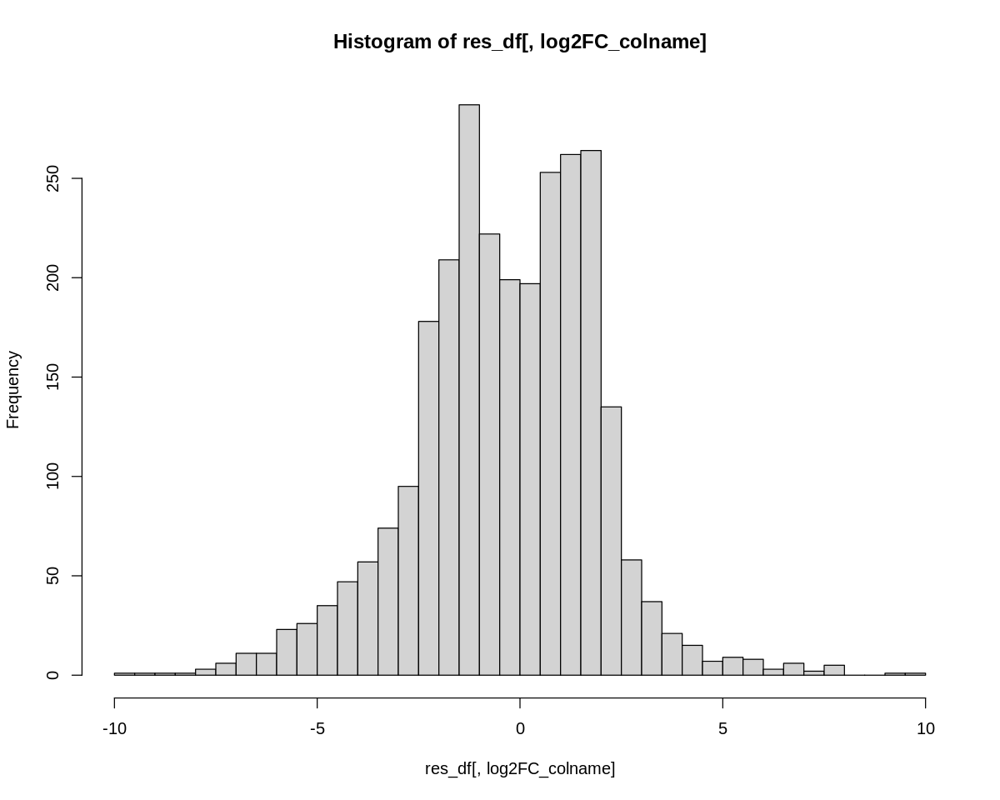

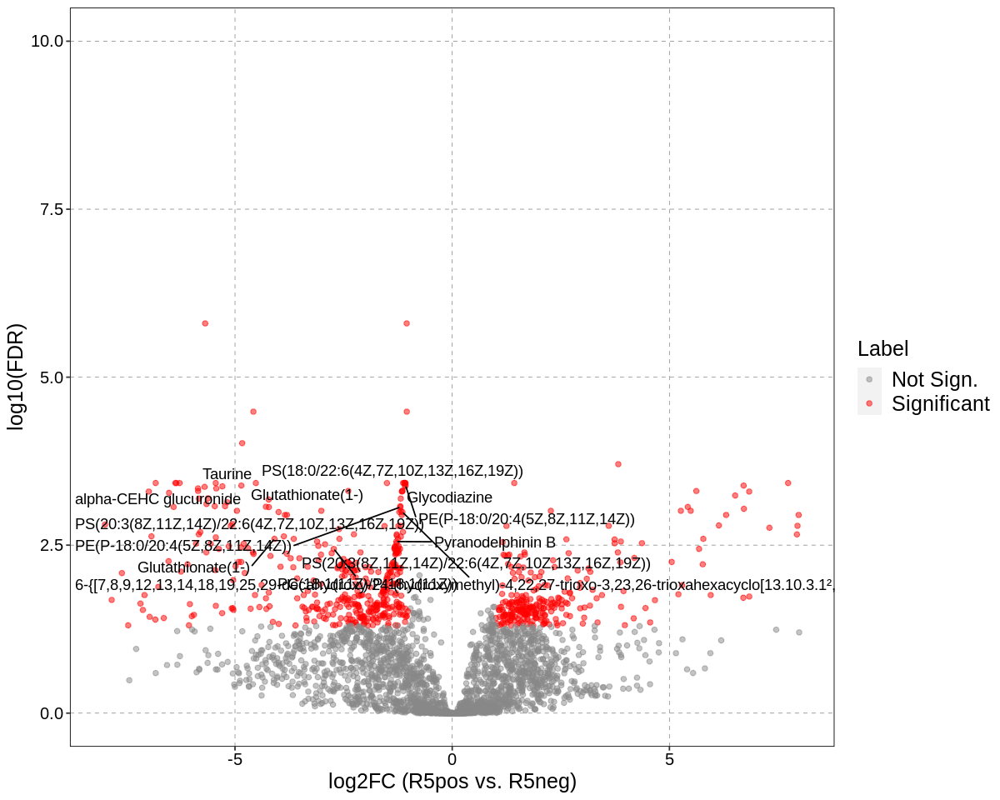

In [13]:
volcano_plot(   res_df = res_df,
                padj_colname = padj_colname,
                log2FC_colname = log2FC_colname,
                p_cut_off = 0.05,
                log2FC_cut_off = 1,
                xlab = glue("log2FC ({contrast})"),
                ylab = 'log10(FDR)',
                xlim = c(-8,8),
                ylim = c(0,10),
                highlight_text = TRUE,
                fig_width = 10,
                fig_height = 8,
                text_size = 12,
                legend_size = 15,
                axis_title_size = 15,
                output_dir = out_dir,
                pdf_prefix = glue('{contrast}_with_highlight{topN}'),
                show_plot = TRUE)

--------

------

# Volcano plot
## log2FC R5pos vs Naive

In [27]:
padj_colname = 'TFDR_R5pos.Naive'
log2FC_colname = 'log2FC_R5posvsNaive'
contrast = "R5pos vs. Naive"

### without highlight

Warning message in min(x, na.rm = na.rm):
“no non-missing arguments to min; returning Inf”
Warning message in max(x, na.rm = na.rm):
“no non-missing arguments to max; returning -Inf”


[1] "range of log10padj: 0\nrange of log2FC: Inf"                
[2] "range of log10padj: 2.21493821146971\nrange of log2FC: -Inf"


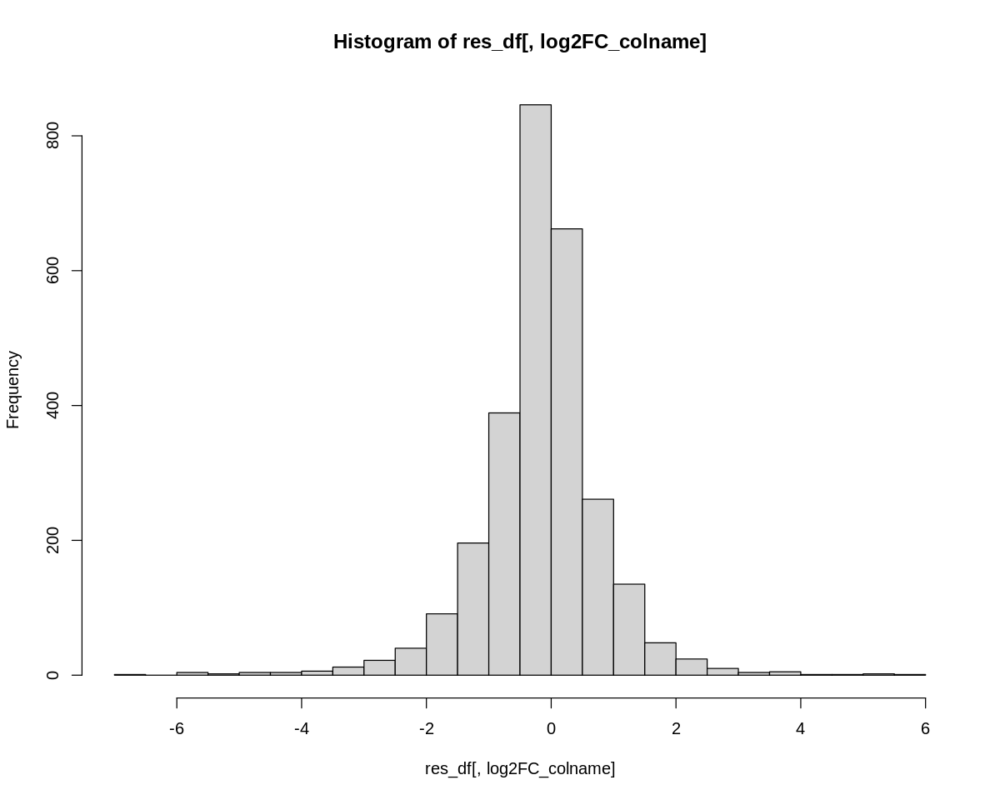

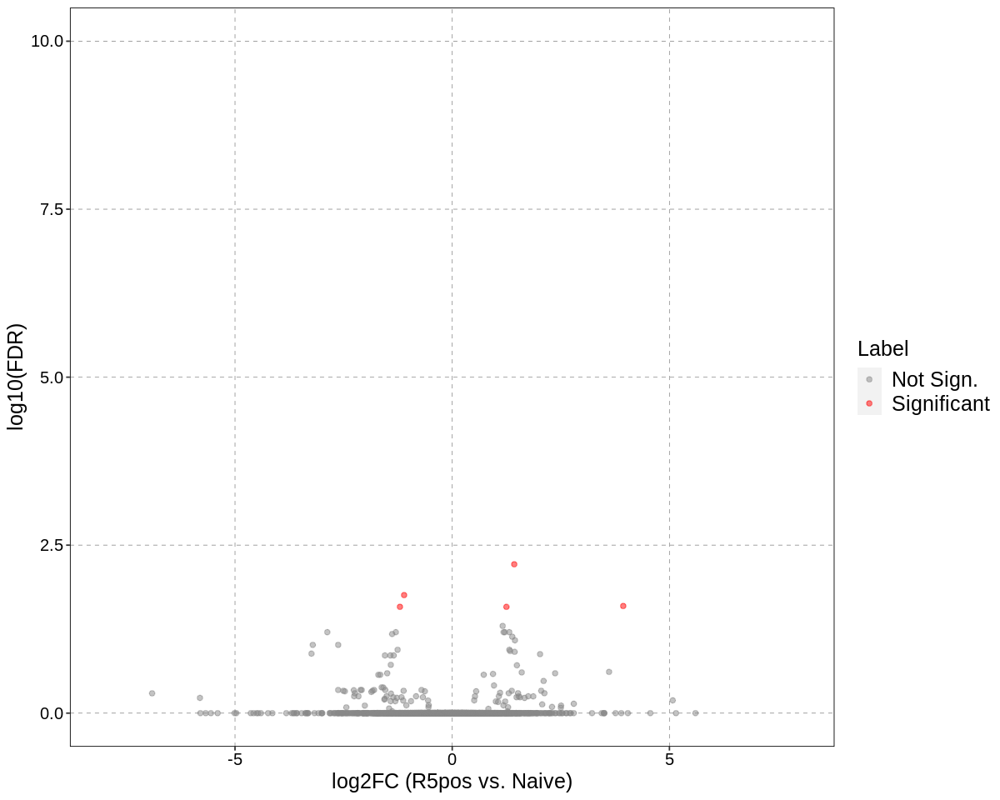

In [28]:
volcano_plot(res_df = res_df,
                padj_colname = padj_colname,
                log2FC_colname = log2FC_colname,
                p_cut_off = 0.05,
                log2FC_cut_off = 1,
                xlab = glue("log2FC ({contrast})"),
                ylab = 'log10(FDR)',
                xlim = c(-8,8),
                ylim = c(0,10),
                highlight = FALSE,
                fig_width = 10,
                fig_height = 8,
                text_size = 12,
                legend_size = 15,
                axis_title_size = 15,
                output_dir = out_dir,
                pdf_prefix = contrast,
                show_plot = TRUE)

### with highlight

### select parameters for highlight

In [29]:
want2annotate_feature_name = TRUE
topN = 50

In [30]:
select_topN2present <- function(res_df, annot_df, topN, padj_label) {
    res_df = res_df %>% arrange_(padj_colname) 
    featIDs = rownames(res_df[1:topN,])
    annot_list = list()
    res_df['highlight'] = ""
    for (featID in featIDs) {
        res_df[featID,'highlight'] = annot_df[annot_df['X.peak.id_number']==featID,'name_1st_guess'][1]
    }
    
    return(res_df)
}

if(want2annotate_feature_name) {
    annot_df = read.csv(annot_file_name, sep = '\t') #somehow only dplyr read.csv works 
    res_df = select_topN2present(res_df, annot_df, topN)
}

Warning message:
“`arrange_()` was deprecated in dplyr 0.7.0.
ℹ Please use `arrange()` instead.
ℹ See vignette('programming') for more help”


In [31]:
unique(res_df$highlight)

[1] ""                                                                                                                                             
[2] "DL-2-Aminooctanoic acid"                                                                                                                      
[3] "Propionylcarnitine"                                                                                                                           
[4] "2-amino-4-({1-[(carboxymethyl)-C-hydroxycarbonimidoyl]-2-[(2-methyl-3-oxo-1-phenylpropyl)sulfanyl]ethyl}-C-hydroxycarbonimidoyl)butanoic acid"
[5] "PS(18:0/18:1(9Z))"                                                                                                                            
[6] "MG(0:0/18:2(9Z,12Z)/0:0)"                                                                                                                     
[7] "SM(d18:1/16:0)"                                                                                                                               
[8] "5-alpha-Cholesta-7,24-dien-3-beta-ol"

Warning message in min(x, na.rm = na.rm):
“no non-missing arguments to min; returning Inf”
Warning message in max(x, na.rm = na.rm):
“no non-missing arguments to max; returning -Inf”


[1] "range of log10padj: 0\nrange of log2FC: Inf"                
[2] "range of log10padj: 2.21493821146971\nrange of log2FC: -Inf"
[1] "With highlighted text"


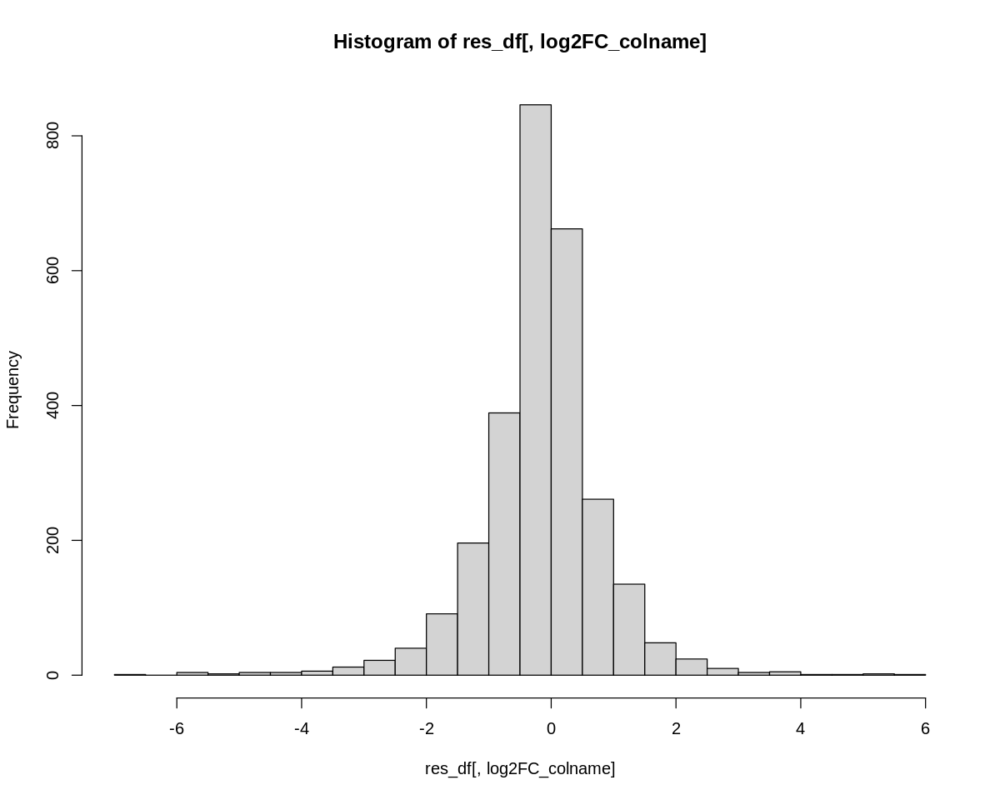

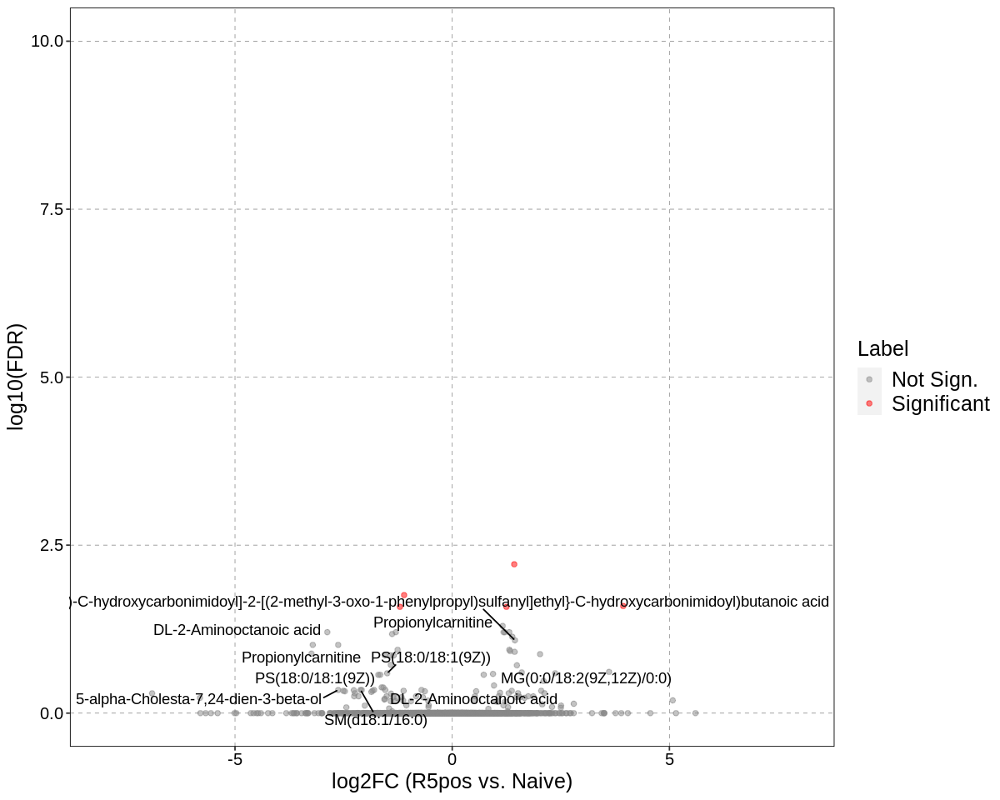

In [32]:
volcano_plot(   res_df = res_df,
                padj_colname = padj_colname,
                log2FC_colname = log2FC_colname,
                p_cut_off = 0.05,
                log2FC_cut_off = 1,
                xlab = glue("log2FC ({contrast})"),
                ylab = 'log10(FDR)',
                xlim = c(-8,8),
                ylim = c(0,10),
                highlight_text = TRUE,
                fig_width = 10,
                fig_height = 8,
                text_size = 12,
                legend_size = 15,
                axis_title_size = 15,
                output_dir = out_dir,
                pdf_prefix = glue('{contrast}_with_highlight{topN}'),
                show_plot = TRUE)

-----

-----

-----

-----

# Volcano plot
## log2FC R5neg vs Naive

In [33]:
padj_colname = 'TFDR_R5neg.Naive'
log2FC_colname = 'log2FC_R5negvsNaive'
contrast = "R5neg vs. Naive"

In [34]:
#' These parameters have been set at the beginning
# want2annotate_feature_name = TRUE
# topN = 1000

select_topN2present <- function(res_df, annot_df, topN, padj_label) {
    res_df = res_df %>% arrange_(padj_colname) 
    featIDs = rownames(res_df[1:topN,])
    annot_list = list()
    res_df['highlight'] = ""
    for (featID in featIDs) {
        res_df[featID,'highlight'] = annot_df[annot_df['X.peak.id_number']==featID,'name_1st_guess'][1]
    }
    
    return(res_df)
}

if(want2annotate_feature_name) {
    annot_df = read.csv(annot_file_name, sep = '\t') #somehow only dplyr read.csv works 
    res_df = select_topN2present(res_df, annot_df, topN)
}

Warning message:
“`arrange_()` was deprecated in dplyr 0.7.0.
ℹ Please use `arrange()` instead.
ℹ See vignette('programming') for more help”


### without highlight

Warning message in min(x, na.rm = na.rm):
“no non-missing arguments to min; returning Inf”
Warning message in max(x, na.rm = na.rm):
“no non-missing arguments to max; returning -Inf”


[1] "range of log10padj: 0\nrange of log2FC: Inf"                
[2] "range of log10padj: 5.79988686527762\nrange of log2FC: -Inf"


Warning message:
“Removed 4 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 4 rows containing missing values (`geom_point()`).”


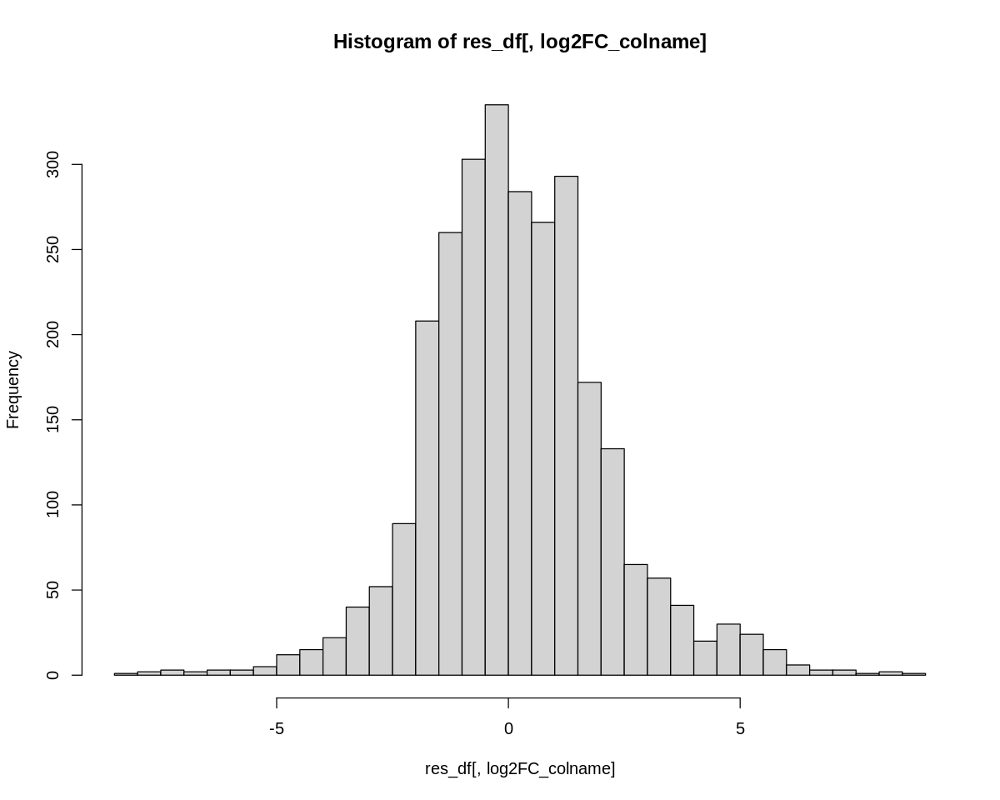

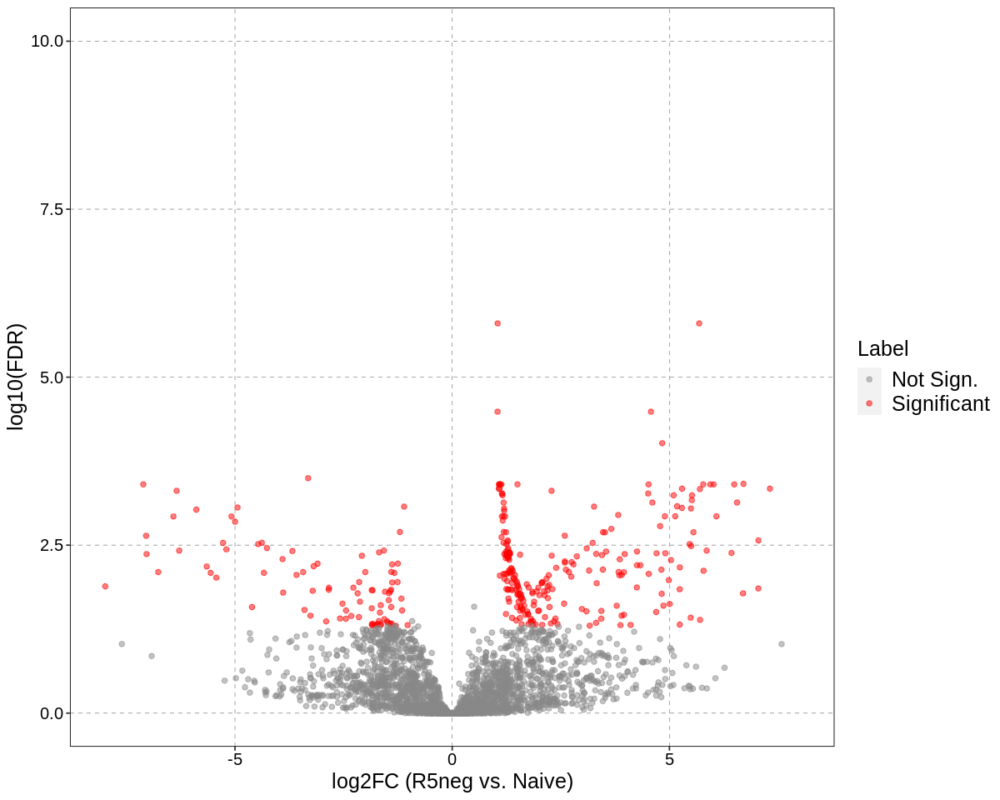

In [35]:
volcano_plot(res_df = res_df,
                padj_colname = padj_colname,
                log2FC_colname = log2FC_colname,
                p_cut_off = 0.05,
                log2FC_cut_off = 1,
                xlab = glue("log2FC ({contrast})"),
                ylab = 'log10(FDR)',
                xlim = c(-8,8),
                ylim = c(0,10),
                highlight = FALSE,
                fig_width = 10,
                fig_height = 8,
                text_size = 12,
                legend_size = 15,
                axis_title_size = 15,
                output_dir = out_dir,
                pdf_prefix = contrast,
                show_plot = TRUE)

### with highlight

### select parameters for highlight

In [36]:
want2annotate_feature_name = TRUE
topN = 150

In [37]:
select_topN2present <- function(res_df, annot_df, topN, padj_label) {
    res_df = res_df %>% arrange_(padj_colname) 
    featIDs = rownames(res_df[1:topN,])
    annot_list = list()
    res_df['highlight'] = ""
    for (featID in featIDs) {
        res_df[featID,'highlight'] = annot_df[annot_df['X.peak.id_number']==featID,'name_1st_guess'][1]
    }
    
    return(res_df)
}

if(want2annotate_feature_name) {
    annot_df = read.csv(annot_file_name, sep = '\t') #somehow only dplyr read.csv works 
    res_df = select_topN2present(res_df, annot_df, topN)
}

Warning message:
“`arrange_()` was deprecated in dplyr 0.7.0.
ℹ Please use `arrange()` instead.
ℹ See vignette('programming') for more help”


In [38]:
unique(res_df$highlight)

[1] ""                                                                                                                                                                                                                                        
 [2] "Glycodiazine"                                                                                                                                                                                                                            
 [3] "PS(18:0/22:6(4Z,7Z,10Z,13Z,16Z,19Z))"                                                                                                                                                                                                    
 [4] "PE(P-18:0/20:4(5Z,8Z,11Z,14Z))"                                                                                                                                                                                                          
 [5] "Taurine"                                                                                                                                                                                                                                 
 [6] "6-{[7,8,9,12,13,14,18,19,25,29-decahydroxy-24-(hydroxymethyl)-4,22,27-trioxo-3,23,26-trioxahexacyclo[13.10.3.1²,⁶.0⁵,¹⁰.0¹¹,²⁸.0¹⁶,²¹]nonacosa-5(10),6,8,11,13,15(28),16,18,20-nonaen-17-yl]oxy}-3,4,5-trihydroxyoxane-2-carboxylic acid"
 [7] "PS(20:3(8Z,11Z,14Z)/22:6(4Z,7Z,10Z,13Z,16Z,19Z))"                                                                                                                                                                                        
 [8] "Glutathionate(1-)"                                                                                                                                                                                                                       
 [9] "Pyranodelphinin B"                                                                                                                                                                                                                       
[10] "alpha-CEHC glucuronide"                                                                                                                                                                                                                  
[11] "Thiomorpholine 3-carboxylate"                                                                                                                                                                                                            
[12] "Citreovirone"                                                                                                                                                                                                                            
[13] "Propionylcarnitine"                                                                                                                                                                                                                      
[14] "PC(18:1(11Z)/P-18:1(11Z))"                                                                                                                                                                                                               
[15] "3',4',5'-Trimethoxycinnamyl alcohol acetate"

Warning message in min(x, na.rm = na.rm):
“no non-missing arguments to min; returning Inf”
Warning message in max(x, na.rm = na.rm):
“no non-missing arguments to max; returning -Inf”


[1] "range of log10padj: 0\nrange of log2FC: Inf"                
[2] "range of log10padj: 5.79988686527762\nrange of log2FC: -Inf"
[1] "With highlighted text"


Warning message:
“Removed 4 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 1 rows containing missing values (`geom_text_repel()`).”
Warning message:
“Removed 4 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 1 rows containing missing values (`geom_text_repel()`).”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on '6-{[7,8,9,12,13,14,18,19,25,29-decahydroxy-24-(hydroxymethyl)-4,22,27-trioxo-3,23,26-trioxahexacyclo[13.10.3.1²,⁶.0⁵,¹⁰.0¹¹,²⁸.0¹⁶,²¹]nonacosa-5(10),6,8,11,13,15(28),16,18,20-nonaen-17-yl]oxy}-3,4,5-trihydroxyoxane-2-carboxylic acid' in 'mbcsToSbcs': dot substituted for <e2>”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“conversion failure on '6-{[7,8,9,12,13,14,18,19,25,29-decahydroxy-24-(hydroxymethyl)-4,22,27-trioxo-3,23,26-trioxahexacyclo[13.10.3.1²,⁶.0⁵,¹⁰.0¹¹,²⁸.0¹⁶,²¹]nonacosa-5(10),6,8,11,13,15(28),16,18,20-nonaen-17-yl]o

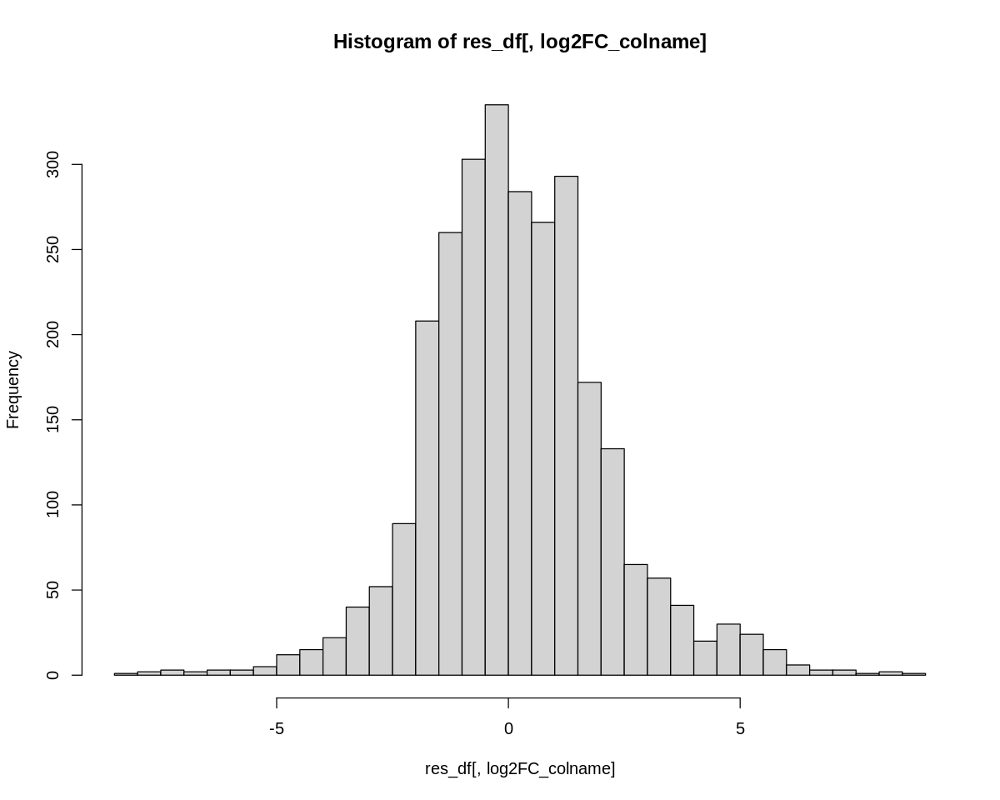

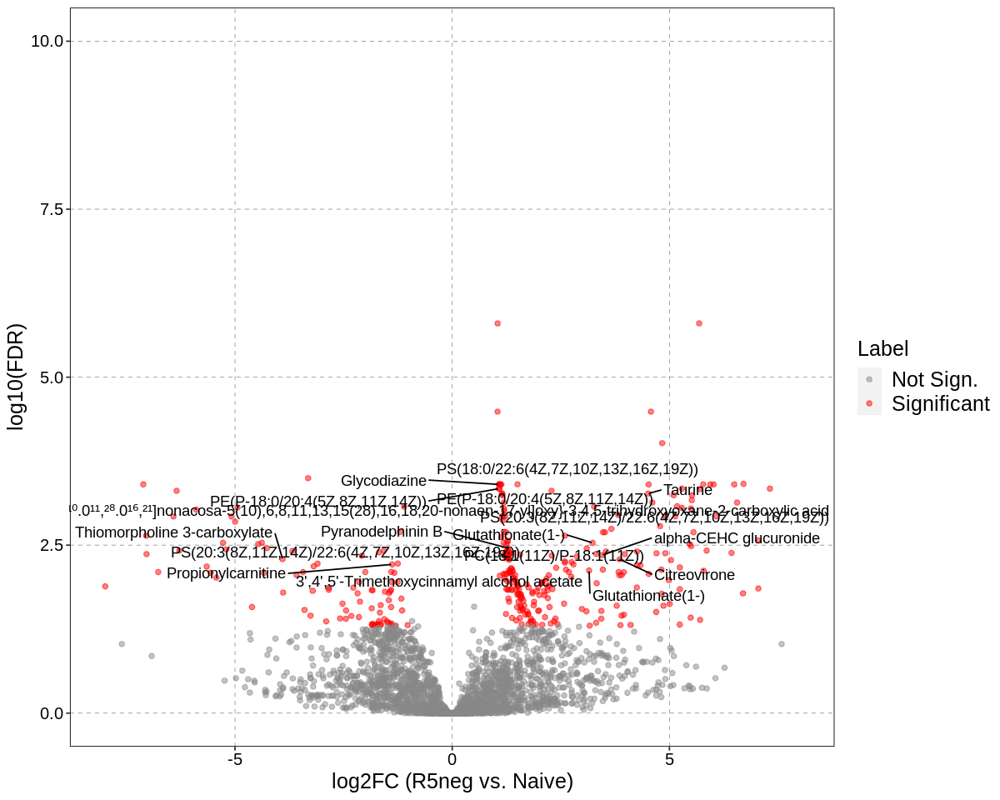

In [39]:
volcano_plot(   res_df = res_df,
                padj_colname = padj_colname,
                log2FC_colname = log2FC_colname,
                p_cut_off = 0.05,
                log2FC_cut_off = 1,
                xlab = glue("log2FC ({contrast})"),
                ylab = 'log10(FDR)',
                xlim = c(-8,8),
                ylim = c(0,10),
                highlight_text = TRUE,
                fig_width = 10,
                fig_height = 8,
                text_size = 12,
                legend_size = 15,
                axis_title_size = 15,
                output_dir = out_dir,
                pdf_prefix = glue('{contrast}_with_highlight{topN}'),
                show_plot = TRUE)